<a href="https://colab.research.google.com/github/bmamaxim/11.2/blob/main/HW1_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

unet/diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/2880f2ca379f41b0226444936bb7a6766a227587/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/2880f2ca379f41b0226444936bb7a6766a227587/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/2880f2ca379f41b0226444936bb7a6766a227587/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/2880f2ca379f41b0226444936bb7a6766a227587/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


  0%|          | 0/20 [00:00<?, ?it/s]

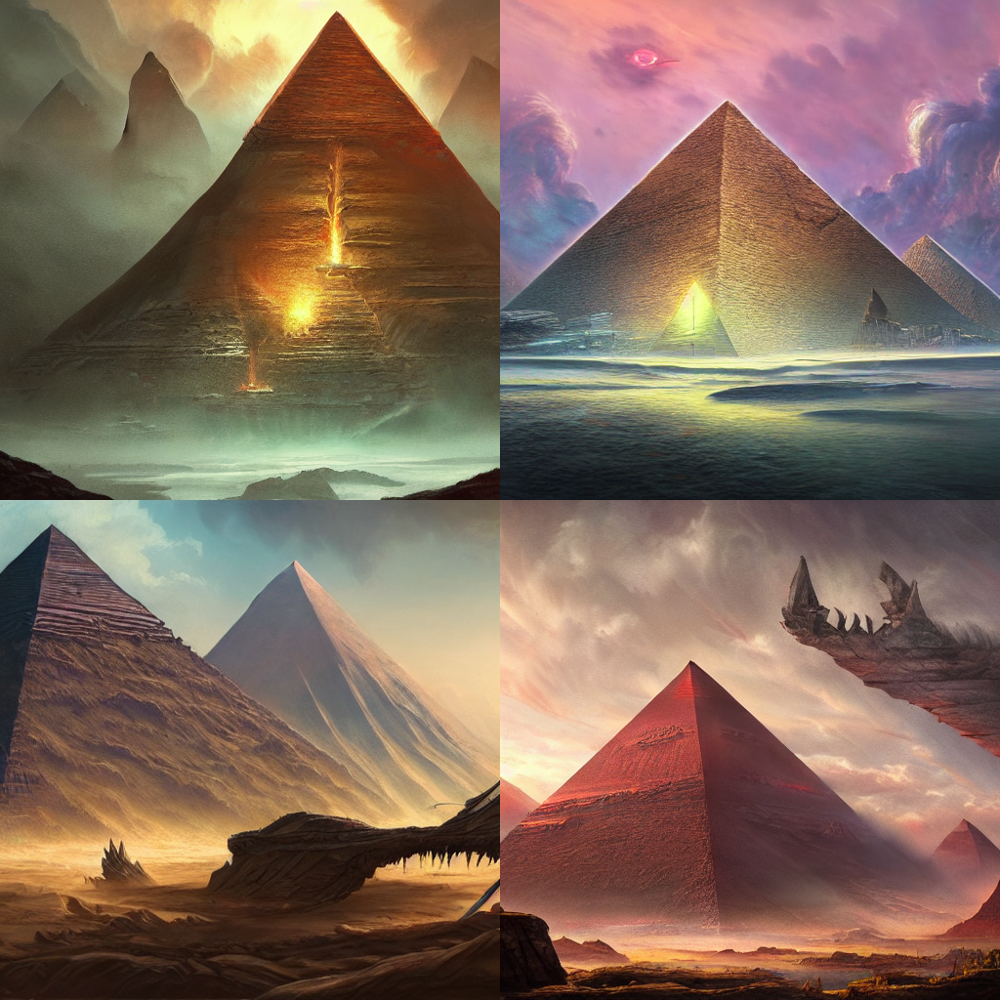

In [4]:
!pip install jax==0.4.23 jaxlib==0.4.23
!pip -q install diffusers
!pip -q install transformers scipy ftfy accelerate
!pip -q install "ipywidgets>=7,<8"
import torch
from diffusers import StableDiffusionPipeline
from PIL import Image

from google.colab import output
output.enable_custom_widget_manager()

stableDiffusion = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16)
stableDiffusion = stableDiffusion.to("cuda")


def createImagesStableDiffusion(prompt='', rows=2, cols=2, iteration=20):
  # Запускаем генерацию
  images =  stableDiffusion([prompt] * (rows*cols), num_inference_steps=iteration).images
  w, h = images[0].size
  grid = Image.new('RGB', size=(cols*w, rows*h))
  grid_w, grid_h = grid.size

  for i, img in enumerate(images):
      grid.paste(img, box=(i%cols*w, i//cols*h))
  display(grid)


createImagesStableDiffusion('a highly detailed epic cinematic concept art an alien pyramid landscape , art station, landscape, concept art, illustration, highly detailed artwork cinematic, hyper realistic painting')


# Новый раздел

  0%|          | 0/20 [00:00<?, ?it/s]

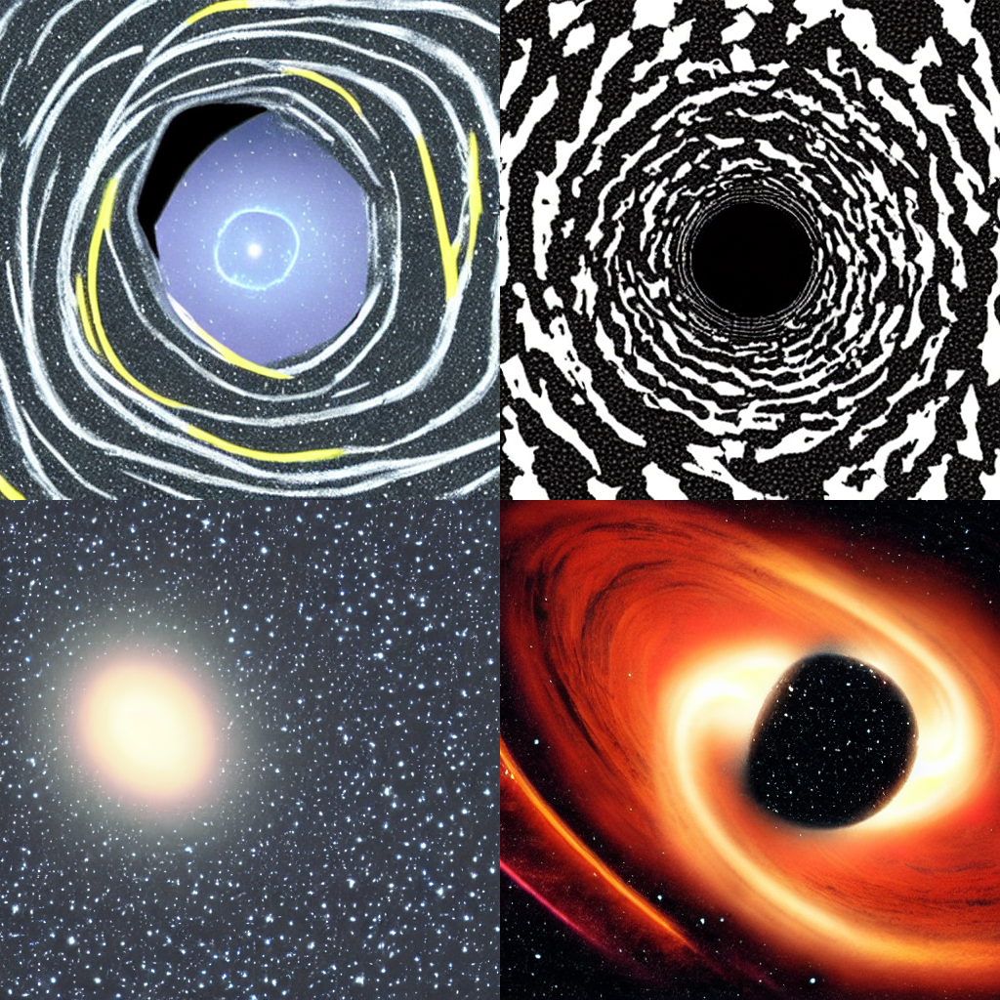

In [5]:
createImagesStableDiffusion('black hole')

# Новый раздел

  0%|          | 0/20 [00:00<?, ?it/s]

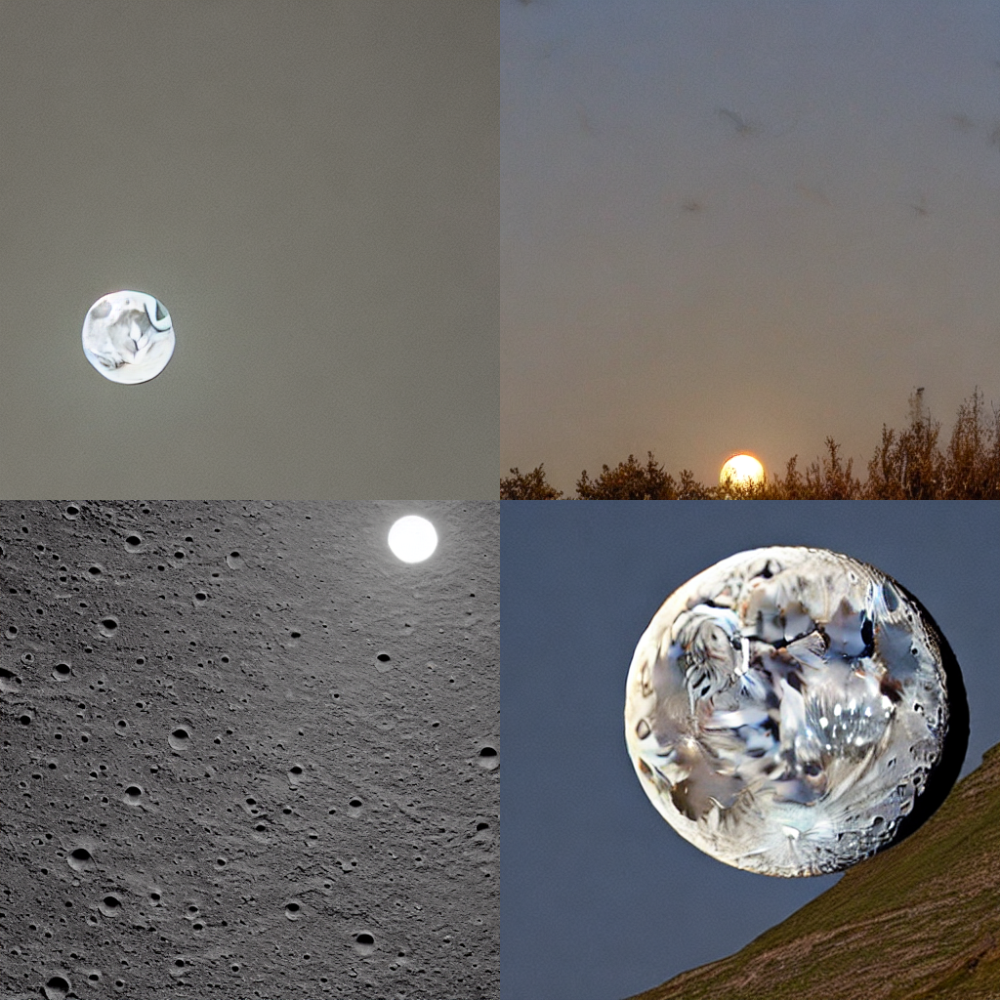

In [6]:
createImagesStableDiffusion('moon against the background of the earth and sun')

# Новый раздел

  0%|          | 0/20 [00:00<?, ?it/s]

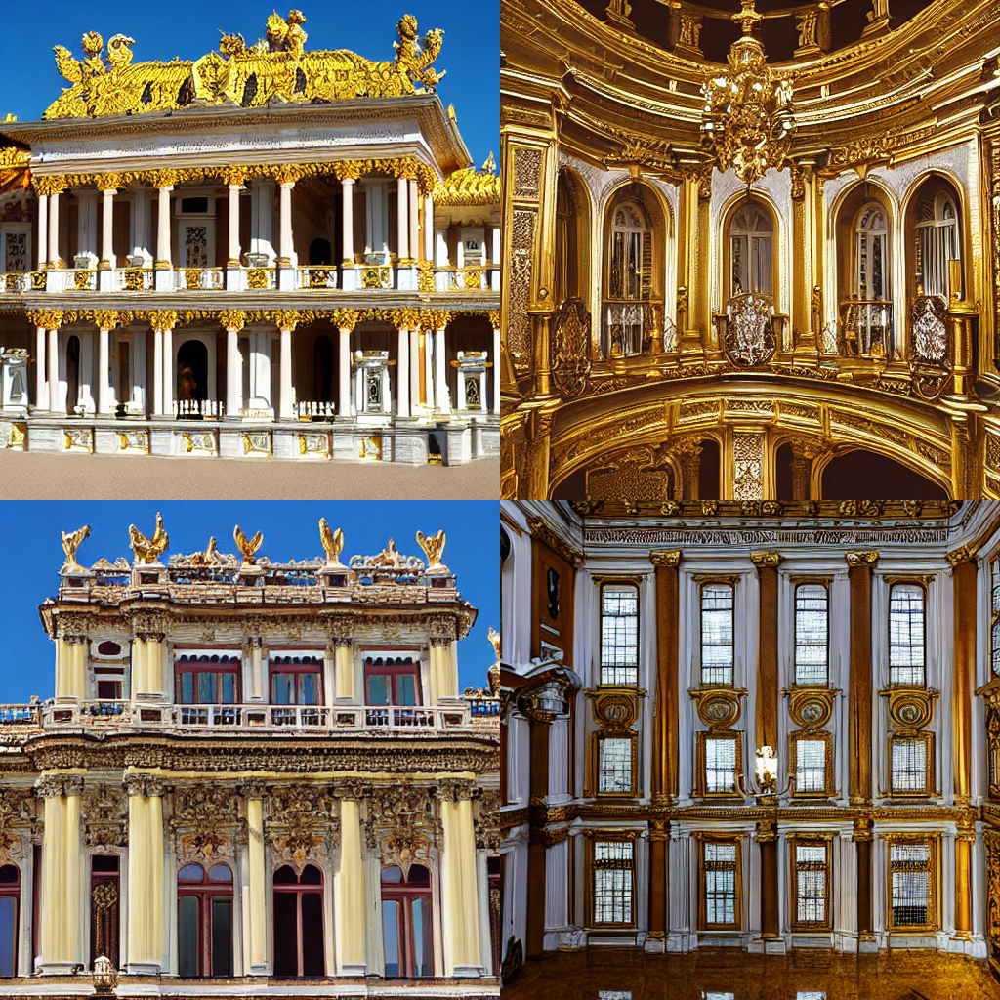

In [7]:
createImagesStableDiffusion('palace, two floors, baroque style')

# Новый раздел

  0%|          | 0/20 [00:00<?, ?it/s]

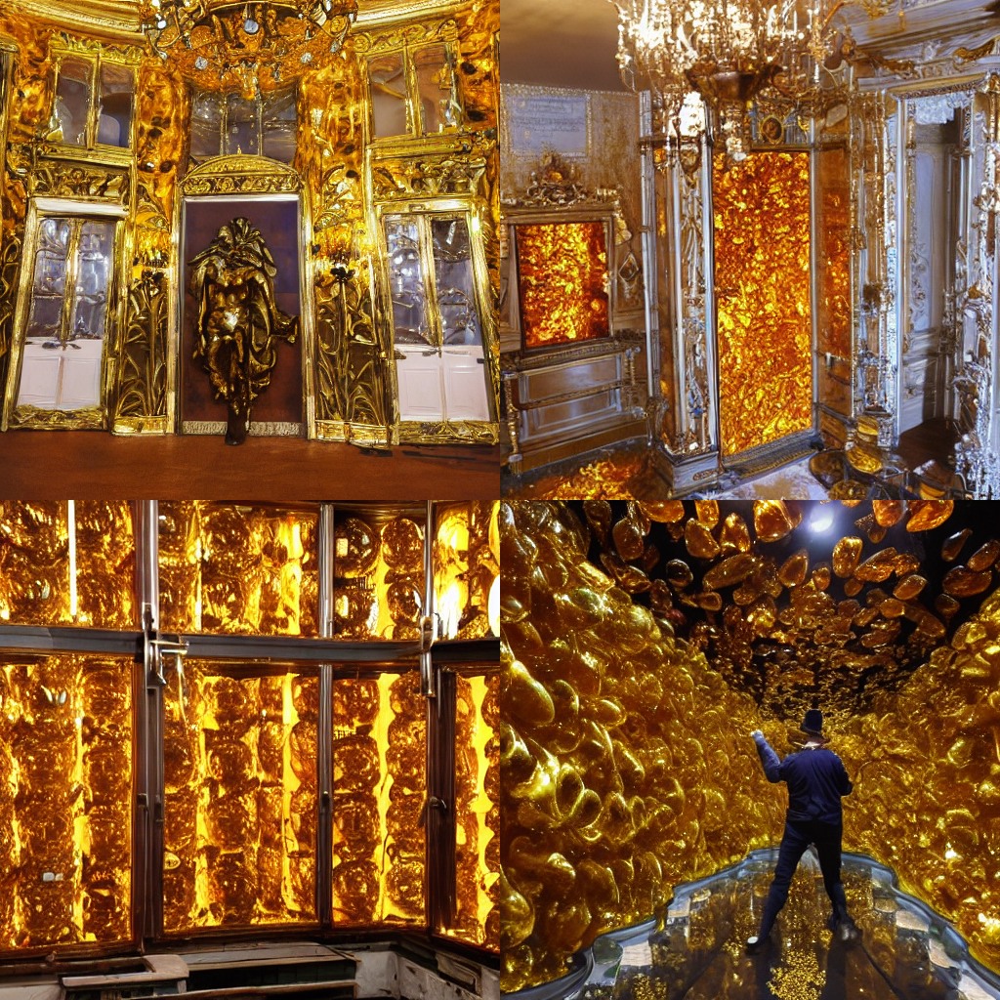

In [8]:
createImagesStableDiffusion('Germans steal the amber room')

# Новый раздел

  0%|          | 0/20 [00:00<?, ?it/s]

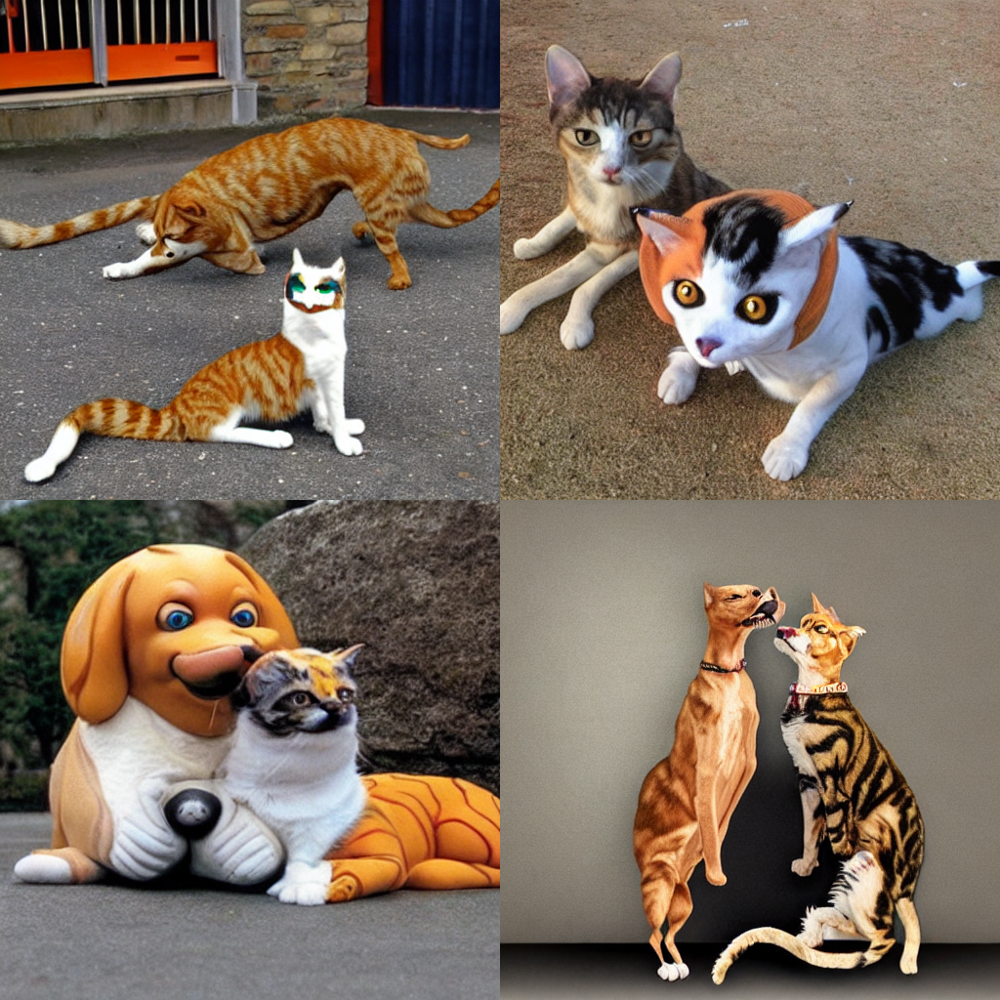

In [10]:
createImagesStableDiffusion("CatDog")